In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

## NEED TO SET UP meas_modelfit *before starting ipython* for code at bottom (not included in lsst_apps!)

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10), 
                         #varFlux2=np.repeat(620*np.sqrt(2), 20),
                         n_sources=600, verbose=True, sourceFluxRange=(2000., 120000.), 
                         variablesAvoidBorder=3.5, psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 9 368.142255845 52.2977464926 0 5000
Variable source: 3 437.677528631 394.051374239 0 5000
Variable source: 7 77.2355874401 392.237254371 0 5000
Variable source: 10 66.5809759253 363.20308398 0 5000
Variable source: 6 352.24315562 433.633351478 0 5000
Variable source: 1 237.897633976 429.430670374 0 5000
Variable source: 11 89.7121431268 243.982084998 0 5000
Variable source: 2 260.515557753 389.705213876 0 5000
Variable source: 8 184.879430277 305.582257912 0 5000
Variable source: 0 300.731568916 220.088731954 0 5000
{'Zogy': {'FP': 35, 'FN': 0, 'TP': 10}, 'ALstack': {'FP': 4, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 27, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}


In [3]:
import lsst.afw.geom as afwGeom

exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

exposure.setPsf(testObj.variablePsf.getCoaddPsf(exposure))
exposure.getPsf().computeKernelImage(afwGeom.Point2D(28., 66.)).getDimensions()

Extent2I(27, 25)

A&L(dec): stats(mean=0.048669923, stdev=24.777611, min=-222.48573, max=343.27081)
Zogy: stats(mean=-0.04197168, stdev=24.977856, min=-926.54474, max=898.99878)
A&L(dec) - Zogy: stats(mean=-0.041019246, stdev=2.704788, min=-850.97797, max=900.02704)
A&L(dec) - A&L: stats(mean=-0.032259393, stdev=6.9194531, min=-58.314606, max=57.100204)
Scorr: stats(mean=2.5644283e-06, stdev=0.00026812186, min=-0.0175256, max=0.014269766)
Scorr_var: stats(mean=0.00025204156, stdev=1.4944854e-06, min=0.00024662129, max=0.0010555496)


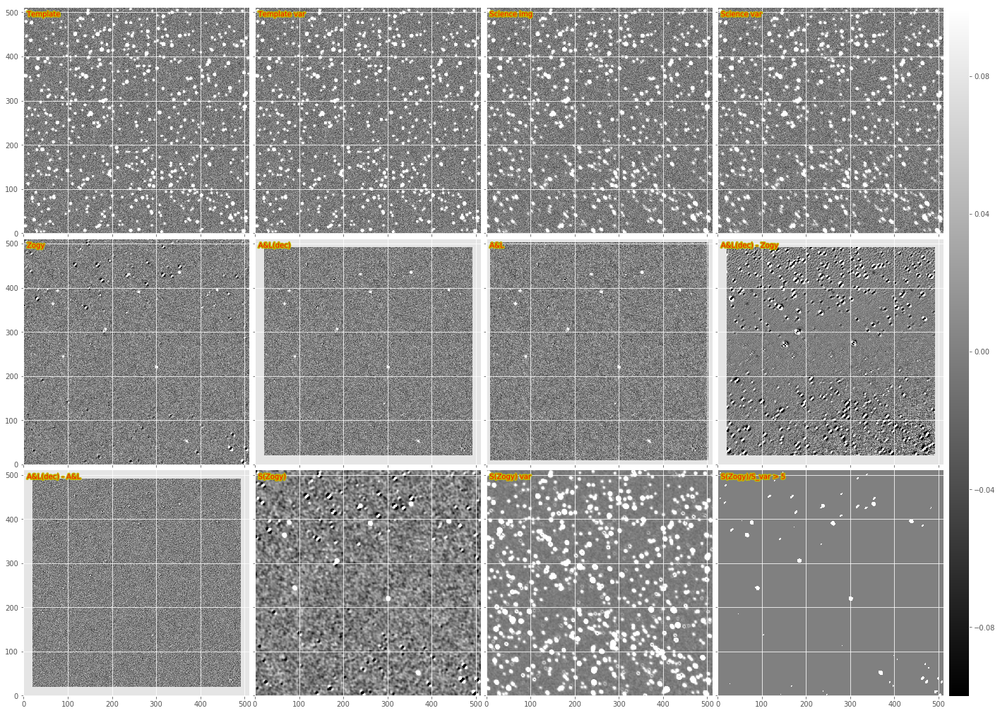

In [4]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.pipe.base as pipeBase
import lsst.ip.diffim as ipDiffim

In [6]:
config = dit.DecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [7]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()

In [8]:
exposure2 = testObj.im2.asAfwExposure()
obj = dit.tasks.PsfMeasurement(exposure2)
obj.run()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
obj = dit.tasks.PsfMeasurement(template2)
obj.run()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

538
540


In [9]:
ALres = dit.tasks.doAlInStack(template2, exposure2, doWarping=False, doDecorr=True, doPreConv=False,
            spatialBackgroundOrder=0, spatialKernelOrder=2)

In [10]:
newExpC = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True).exposure

Grid parameters: 46 46 41.8671875 41.8671875 14 14


diffimTests/imageMapReduce.py:282: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:283: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [11]:
testObj2 = testObj.clone()
testObj2.ALres.decorrelatedDiffim = newExpC
testObj2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 35, 'TP': 10}}

Finally, let's compare it to spatially-varying ZOGY!

NOTE that the `gridStep/gridSize` combo doesn't seem to correctly fully cover the entire image in all cases! In this case (the default), it does, but if I uncomment the 'gridStep' setting line below, it doesn't.

In [12]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [13]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

Grid parameters: 46 46 37.31640625 37.31640625 14 14


In [14]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ
testObj3.S_Zogy = newExpZ_Scorr
testObj3.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 1, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 1, 'TP': 10}}

A&L(dec): stats(mean=0.051389098, stdev=24.659925, min=-219.71222, max=333.62772)
Zogy: stats(mean=0.038896445, stdev=24.774048, min=-664.19006, max=400.3591)
A&L(dec) - Zogy: stats(mean=-0.017226698, stdev=27.402258, min=-255.60265, max=210.60814)
A&L(dec) - A&L: stats(mean=-0.034124952, stdev=6.8241849, min=-56.203217, max=48.563858)
Scorr: stats(mean=3.2182511e-06, stdev=0.00025002242, min=-0.0041951239, max=0.014513666)
Scorr_var: stats(mean=0.00024767284, stdev=1.5324065e-05, min=0.0002161278, max=0.00089541508)


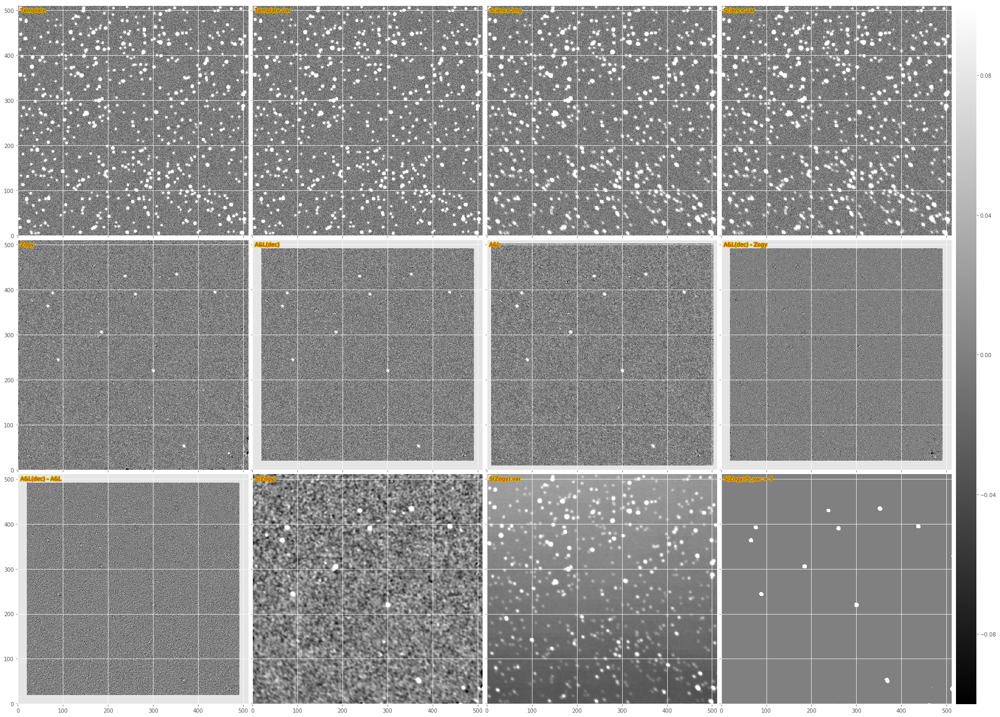

In [15]:
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

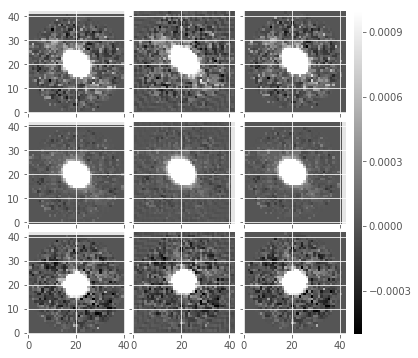

In [16]:
def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
    
dit.plotImageGrid((gp(exposure2, [80,80]), gp(newExpC, [80,80]), gp(newExpZ, [80,80]),
                   gp(exposure2, [255,255]), gp(newExpC, [255,255]), gp(newExpZ, [255,255]),
                   gp(exposure2, [480,480]), gp(newExpC, [480,480]), gp(newExpZ, [480,480]),), 
                  clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

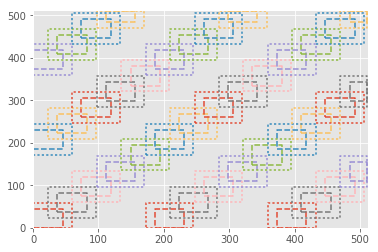

In [17]:
task.plotBoxes(exposure2.getBBox(), skip=5)

`inImageSpace = True`

Need to increase the border size

Definitely takes a while!

{'gridStepY': 3.0, 'gridStepX': 3.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 6.0, 'borderSizeY': 6.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 46 46 12.7421875 12.7421875 28 28


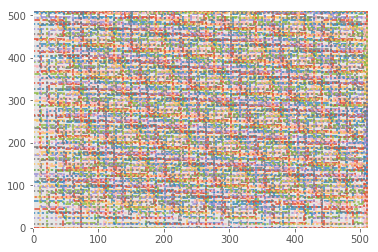

In [18]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 3
#config.gridSizeX = config.gridSizeY = 15
config.borderSizeX = config.borderSizeY = 6
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=5)

In [19]:
newExpZIS = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure
#newExpZIS_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

In [20]:
testObj3IS = testObj.clone()
testObj3IS.ALres.decorrelatedDiffim = newExpC
testObj3IS.D_Zogy = newExpZIS  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 3, 'TP': 10}}

stats(mean=0.18508714, stdev=2.5660434, min=-672.19006, max=386.28979)


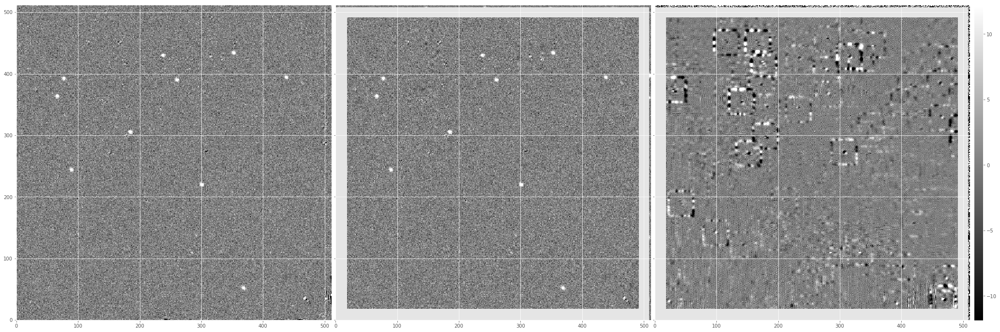

In [21]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS), ga(newExpZ)-ga(newExpZIS)), imScale=12)

In [22]:
#newExp_Scorr = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf,
#                       Scorr=True, forceEvenSized=True).exposure
newExp_Ispace = task.run(exposure, template=template, inImageSpace=True, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure, template=template, inImageSpace=False, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure

stats(mean=0.075261317, stdev=24.652197, min=-215.38904, max=338.81369)
stats(mean=0.018441375, stdev=24.679312, min=-551.59259, max=338.81424)
stats(mean=-0.00011198925, stdev=0.0042004087, min=-0.80084181, max=0.5688622)


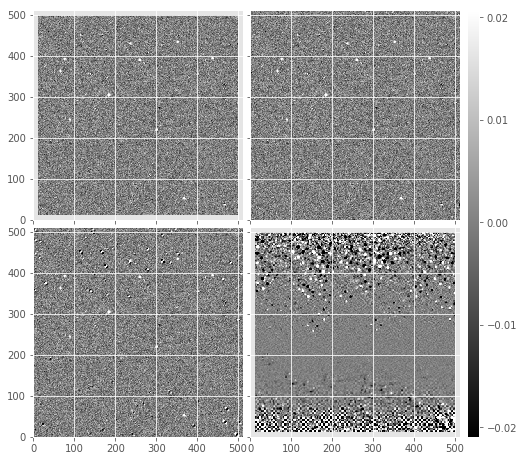

In [23]:
#Sim = ga(newExp_Scorr)
#Svar = newExp_Scorr.getMaskedImage().getVariance().getArray()
#print dit.computeClippedImageStats(Sim-testObj.S_Zogy.im)
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

In [24]:
newExp_Ispace = task.run(exposure2, template=template2, inImageSpace=True, 
                       Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure2, template=template2, inImageSpace=False, 
                       Scorr=False, forceEvenSized=True).exposure

stats(mean=-0.096779041, stdev=24.556707, min=-127.67795, max=486.0)
stats(mean=0.052739725, stdev=24.627878, min=-449.20645, max=292.64359)
stats(mean=-0.18238884, stdev=2.150923, min=-125.60004, max=457.20645)


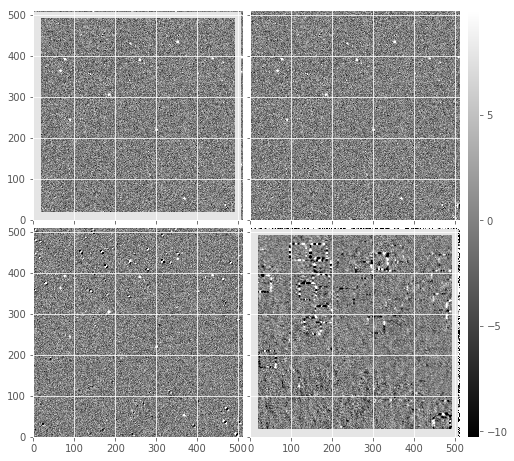

In [25]:
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

Looks like we may need to make a smoother approximation to the PSF at each point.

Jim pointed me to `DoubleShapeletPsfApprox` -- look at `testForcedPlugin` in `meas_modelfit/tests/testDoubleShapeletPsfApprox.py`...

In [26]:
import os
import lsst.meas.modelfit as meas_modelfit
import lsst.afw.image as afwImage
import testDoubleShapeletPsfApprox as td
reload(td);

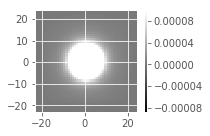

In [27]:
import lsst.utils.tests

class HigherOrderTestCase0(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self):
        np.random.seed(500)
        image = afwImage.ImageD(os.path.join("data", "psfs/great3-0.fits"))
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=3, outerOrder=2,
            atol=0.0005
        )

tc = HigherOrderTestCase0()
tc.setUp()
dit.plotImageGrid((tc.psf,))
msf = tc.testFitShapelets()

<class 'lsst.afw.image.image.image.ImageD'> <class 'lsst.afw.image.image.image.ImageD'>
stats(mean=5.2876473617836937e-06, stdev=4.4429553733233831e-06, min=-0.00013553022674543712, max=0.00031488658680425136)


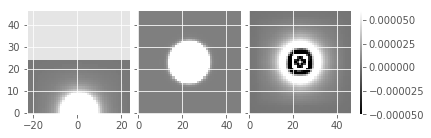

In [28]:
dataImage, modelImage = tc.makeImages(msf)
print type(dataImage), type(modelImage)
print dit.computeClippedImageStats(dataImage.getArray()-modelImage.getArray())
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

Now try it on my image's psfs!

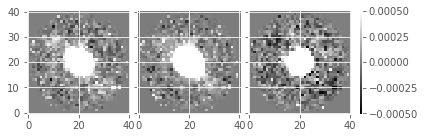

In [29]:
import lsst.afw.geom as afwGeom

def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
def gp2(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1]))
        
dit.plotImageGrid((gp(exposure2, [80,80]), gp(exposure2, [255,255]), gp(exposure2, [480,480])))
#                   clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

tc.setImage(gp2(exposure2, [80,80]))

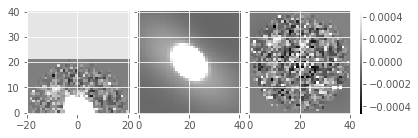

In [30]:
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

See if any other models get rid of those wings!

In [34]:
class SingleGaussianTestCase(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=lsst.afw.detection.GaussianPsf(25, 25, 2.0),
            innerOrder=0, outerOrder=0, peakRatio=0.0)
        self.setImage(image)

class HigherOrderTestCase0(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=3, outerOrder=2,
            atol=0.0005)
        self.setImage(image)

class HigherOrderTestCase1(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=2, outerOrder=1,
            atol=0.002)
        self.setImage(image)

8.09554243811e-05


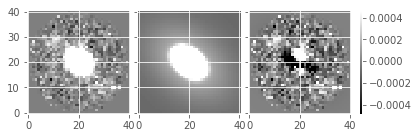

In [36]:
tc = SingleGaussianTestCase()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

3.98193450578e-05


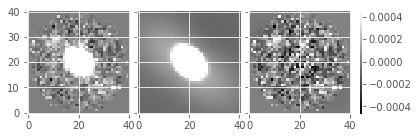

In [37]:
tc = HigherOrderTestCase0()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

4.05930173818e-05


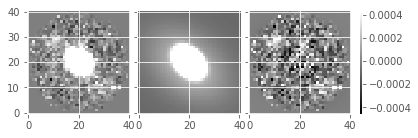

In [38]:
tc = HigherOrderTestCase1()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

In [39]:
def toTime(psf):
    tc = HigherOrderTestCase0()
    tc.setUp(psf)
    msf = tc.testFitShapelets()
    dataImage, modelImage = tc.makeImages(msf)

psf = gp2(exposure2, [80,80])
%timeit toTime(psf)

100 loops, best of 3: 2.12 ms per loop


In [40]:
def toTime(psf):
    tc = HigherOrderTestCase1()
    tc.setUp(psf)
    msf = tc.testFitShapelets()
    dataImage, modelImage = tc.makeImages(msf)

psf = gp2(exposure2, [80,80])
%timeit toTime(psf)

1000 loops, best of 3: 1.83 ms per loop


OK, now integrate the shapelet fitting into the Zogy stuff...  rewrite the task here.

In [44]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        template = kwargs.get('template')
        science = kwargs.get('science')
        inImageSpace = kwargs.get('inImageSpace', False)
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        fitPsfs = kwargs.get('fitPsfs', False)
                
        # Psf and image for science img (index 2)
        subExp2 = science.Factory(science, expandedSubExp.getBBox())
        if variablePsf2 is None:
            psf2 = science.getPsf().computeImage(center).getArray()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
            
        fitPsfSuccess = False
        if fitPsfs:
            try:
                center2 = [(bbox.getBeginX() + bbox.getEndX()) // 2., 
                           (bbox.getBeginY() + bbox.getEndY()) // 2.]
                if center2[0] <= psf2.shape[0]:
                    center2[0] = psf2.shape[0] + 1
                elif center2[0] >= fullBBox.getMaxX() - psf2.shape[0]:
                    center2[0] = fullBBox.getMaxX() - psf2.shape[0] - 1
                if center2[1] <= psf2.shape[1]:
                    center2[1] = psf2.shape[1] + 1
                elif center2[1] >= fullBBox.getMaxY() - psf2.shape[1]:
                    center2[1] = fullBBox.getMaxY() - psf2.shape[1] - 1
                center2 = afwGeom.Point2D(center2[0], center2[1])
                tc = HigherOrderTestCase0()
                tc.setUp(science.getPsf().computeImage(center2))
                image = tc.psf.computeKernelImage()
                msf = tc.Algorithm.initializeResult(tc.ctrl)
                tc.Algorithm.fitMoments(msf, tc.ctrl, image)
                tc.Algorithm.fitProfile(msf, tc.ctrl, image)
                tc.Algorithm.fitShapelets(msf, tc.ctrl, image)
                dataImage, modelImage = tc.makeImages(msf)
                psf2 = modelImage.getArray()
                fitPsfSuccess = True
            except:
                fitPsfSuccess = False
            
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        subExp1 = template.Factory(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        
#         if fitPsfs:
#             print("HERE1", center)
#             tc = HigherOrderTestCase0()
#             tc.setUp()
#             tc.setImage(template.getPsf().computeImage(center))
#             msf = tc.testFitShapelets()
#             dataImage, modelImage = tc.makeImages(msf)
#             psf1 = modelImage

        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]

        #shape2 = subExp2.getPsf().computeShape(center)
        #shape1 = subExp1.getPsf().computeShape(center)
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if not fitPsfSuccess and psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this really helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        D_zogy, var_zogy = None, None
        if not inImageSpace:
            padSize0 = subarr1.shape[0]//2 - psf1.shape[0]//2
            padSize1 = subarr1.shape[1]//2 - psf1.shape[1]//2
            # Hastily assume the image is even-sized and the psf is odd... and that the two images
            #   and psfs have the same dimensions!
            psf1 = np.pad(psf1b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            psf2 = np.pad(psf2b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            if psf1.shape[0] > subarr1.shape[0]:
                psf1 = psf1[:-1, :]
                psf2 = psf2[:-1, :]
            elif psf1.shape[0] < subarr1.shape[0]:
                psf1 = np.pad(psf1, ((0, 1), (0, 0)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 1), (0, 0)), mode='constant', constant_values=0)
            if psf1.shape[1] > subarr1.shape[1]:
                psf1 = psf1[:, :-1]
                psf2 = psf2[:, :-1]
            elif psf1.shape[1] < subarr1.shape[1]:
                psf1 = np.pad(psf1, ((0, 0), (0, 1)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 0), (0, 1)), mode='constant', constant_values=0)
            #psf1 = dit.psf.recenterPsf(psf1)
            #psf2 = dit.psf.recenterPsf(psf2)
            psf1 /= psf1.sum()
            psf2 /= psf2.sum()

            #shape2 = dit.arrayToAfwPsf(psf2).computeShape(afwGeom.Point2D(center[0], center[1]))
            #shape1 = dit.arrayToAfwPsf(psf1).computeShape(afwGeom.Point2D(center[0], center[1]))
            #print center, shape2, shape1

            D_zogy, var_zogy = dit.zogy.computeZogyFourierSpace(subarr1, subarr2, 
                                  subvar1, subvar2, psf1, psf2, 
                                  sig1=sig1, sig2=sig2)
        else:
            D_zogy, var_zogy = dit.zogy.computeZogyImageSpace(subarr1, subarr2,
                                   subvar1, subvar2, psf1, psf2, 
                                   sig1=sig1, sig2=sig2, padSize=7)
            #print 'HERE:', subExp.getBBox(), np.sum(~np.isnan(D_zogy)), np.sum(~np.isnan(var_zogy))

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()
        tmpIM.getImage().getArray()[:, :] = D_zogy
        tmpIM.getVariance().getArray()[:, :] = var_zogy
        # need to eventually compute diffim PSF and set it here.
        out = tmpExp.Factory(tmpExp, subExp.getBBox())
                
        #print template
        #img += 10.
        #return out #, psf1_orig, psf2_orig
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

In [46]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 15
config.borderSizeX = config.borderSizeY = 4
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 4.0, 'borderSizeY': 4.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [47]:
newExpZ = task.run(exposure2, science=exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure

Grid parameters: 46 46 37.31640625 37.31640625 18 18


In [48]:
newExpZIS2 = task.run(exposure2, science=exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure

diffimTests/imageMapReduce.py:282: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:283: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


stats(mean=-0.11866012, stdev=17.08535, min=-197.37094, max=198.80626)


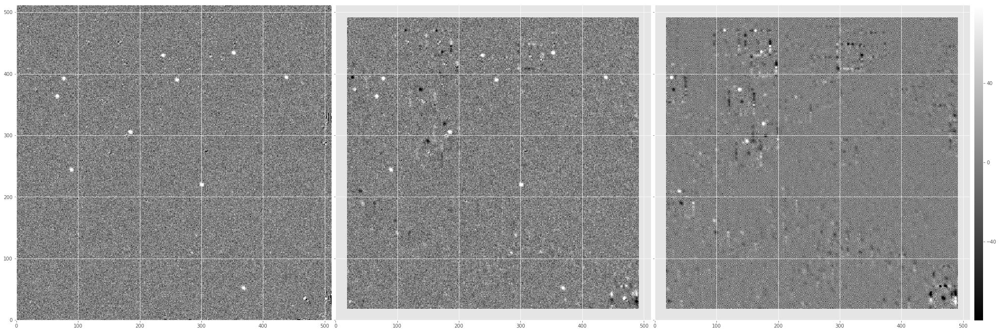

In [49]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS2))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS2), ga(newExpZ)-ga(newExpZIS2)), imScale=12)

In [50]:
newExpZIS2a = task.run(exposure2, science=exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True, fitPsfs=True).exposure

stats(mean=-0.46086469, stdev=21.547731, min=-200.93719, max=165.70834)


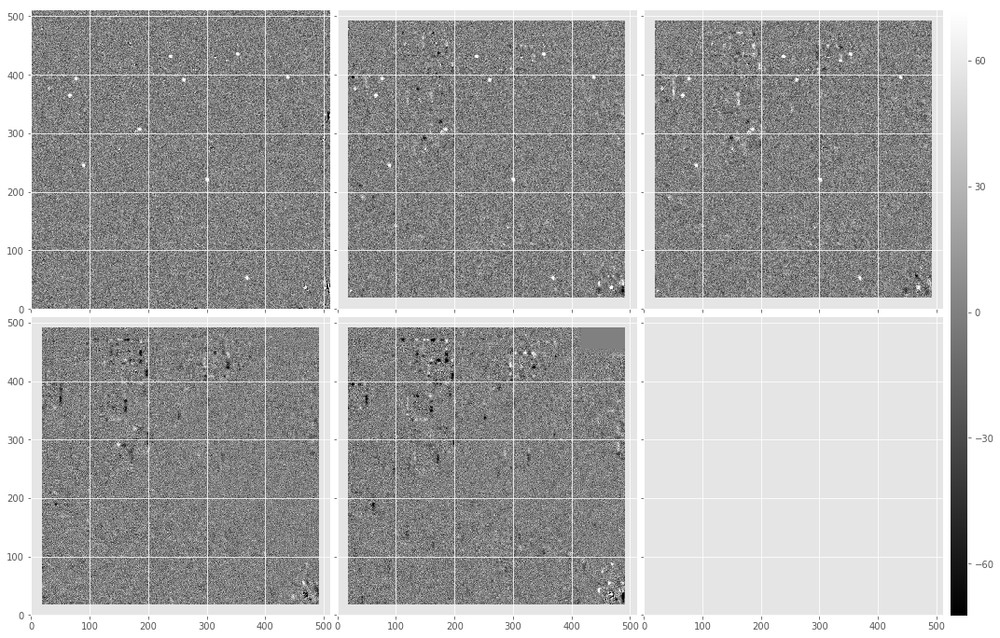

In [51]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS2a))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS2), ga(newExpZIS2a), 
                   ga(newExpZ)-ga(newExpZIS2a), ga(newExpZIS2)-ga(newExpZIS2a)), imScale=6)

In [52]:
center = afwGeom.Point2D(321, 498)
psf2 = exposure2.getPsf().computeImage(center)
#dit.plotImageGrid((psf2,))
tc = HigherOrderTestCase1()
tc.setUp(psf2)
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

MeasurementError: 
  File "src/DoubleShapeletPsfApprox.cc", line 221, in static void lsst::meas::modelfit::DoubleShapeletPsfApproxAlgorithm::fitMoments(shapelet::MultiShapeletFunction &, const Control &, const afw::detection::Psf::Image &)
    Semi-minor radius derived from moments (1.94084) is less than lower bound (1). {0}
lsst::meas::base::MeasurementError: 'Semi-minor radius derived from moments (1.94084) is less than lower bound (1).'


0.00134903382327


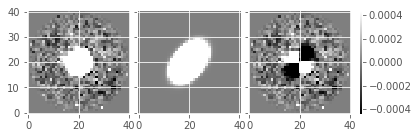

In [53]:
center = afwGeom.Point2D(433, 470)
psf2 = exposure2.getPsf().computeImage(center)
#dit.plotImageGrid((psf2,))
tc = SingleGaussianTestCase() 
#tc = HigherOrderTestCase1()
#tc = HigherOrderTestCase0()
tc.setUp(psf2)

image = tc.psf.computeKernelImage()
msf = tc.Algorithm.initializeResult(tc.ctrl)
tc.Algorithm.fitMoments(msf, tc.ctrl, image)
tc.Algorithm.fitProfile(msf, tc.ctrl, image)
tc.Algorithm.fitShapelets(msf, tc.ctrl, image)
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

5.82317761095e-05


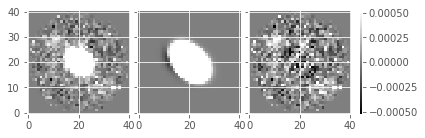

In [55]:
center = afwGeom.Point2D(46, 46)
psf2 = exposure2.getPsf().computeImage(center)
#dit.plotImageGrid((psf2,))
tc = HigherOrderTestCase1()
tc.setUp(psf2)

image = tc.psf.computeKernelImage()
msf = tc.Algorithm.initializeResult(tc.ctrl)
tc.Algorithm.fitMoments(msf, tc.ctrl, image)
tc.Algorithm.fitProfile(msf, tc.ctrl, image)
#prev = lsst.shapelet.MultiShapeletFunction(msf)
tc.Algorithm.fitShapelets(msf, tc.ctrl, image)
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))